### Problem Statement

Surprise Housing, a US-based housing company, plans to enter the Australian market by using data analytics to buy houses below their market value and sell them at a higher price. They have collected a dataset of house sales in Australia and want to build a regression model using regularisation to predict the value of potential properties. The company wants to know which variables are significant in predicting house prices and how well they can describe the price. Additionally, they need to find the optimal value of lambda for ridge and lasso regression to make informed investment decisions.

### Business Goal

The objective is to create a model that accurately represents the relationship between house prices and the available independent variables. This model will enable the management team to comprehend how prices fluctuate based on these variables, allowing them to adapt their strategy to focus on areas with high returns. Moreover, this model will serve as a valuable tool for the management to grasp the pricing dynamics within a new market.

### Note: Install category enconder in case of not exist on system
Used for binary encoding with high cardinality values.

In [3]:
# Import Required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import GridSearchCV

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


### Data Understanding and Prepration

In [5]:
# Load data from csv
house_data = pd.read_csv("train.csv")
house_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
#Check all columns 
house_data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
  

In [7]:
#get shape of dataframe
house_data.shape

(1460, 81)

In [8]:
#get model description of dataframe
house_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
#cheked any null column exist or not
null_col_check = house_data.nunique()
null_col_check[null_col_check==0]

Series([], dtype: int64)

In [10]:
#Droping columns with max missing values
house_data = house_data.drop(columns=['PoolQC','Fence', 'MiscFeature'])

In [11]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 78 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [12]:
house_data.Alley.value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

In [13]:
#check unique values of FireplaceQu 
house_data.FireplaceQu.value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [14]:
#check Missing values of columns
house_data.isnull().sum()[house_data.isnull().sum()>0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
dtype: int64

In [15]:
#Drop Alley column because more than 90% values are missing or No Alley
house_data=house_data.drop(columns=['Alley'])

In [16]:
#replace Nan value with NA for FireplaceQu which means No Fireplace 
house_data.FireplaceQu = house_data.FireplaceQu.fillna('NA')

In [17]:
#check missing values again
house_data.isnull().sum()[house_data.isnull().sum()>0]

LotFrontage     259
MasVnrType        8
MasVnrArea        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
GarageType       81
GarageYrBlt      81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64

In [18]:
#check unique values of LotFrontage
house_data.LotFrontage.value_counts()

60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
        ... 
137.0      1
141.0      1
38.0       1
140.0      1
46.0       1
Name: LotFrontage, Length: 110, dtype: int64

In [19]:
#check median of LotFrontage
LotFrontage_median = house_data.LotFrontage.median()
LotFrontage_median

69.0

In [20]:
#Replace missing values of LotFrontage with the median value, as the presence of outliers in the data has been observed from the Describe section.
house_data.LotFrontage = house_data.LotFrontage.fillna(LotFrontage_median)

In [21]:
#Replace missing values of MasVnrArea with the median value, as the presence of outliers in the data has been observed from the Describe section.
house_data.MasVnrArea = house_data.MasVnrArea.fillna(house_data.MasVnrArea.median())    

In [22]:
#Replace NaN values of MasVnrArea with "None," indicating no masonry type.
house_data.MasVnrType = house_data.MasVnrType.fillna('None')

In [23]:
#Replace NaN values of BsmtQual with "NA" indicating no basement.
house_data.BsmtQual = house_data.BsmtQual.fillna('NA')

In [24]:
#replace Nan values of BsmtCond with "NA" indicating no Basement
house_data.BsmtCond = house_data.BsmtCond.fillna('NA')

In [25]:
#replace Nan values of BsmtExposure with "No" indicating No Exposure
house_data.BsmtExposure = house_data.BsmtExposure.fillna('No')

In [26]:
#replace Nan values of BsmtFinType1 with "NA" indicating. No Basement
house_data.BsmtFinType1 = house_data.BsmtFinType1.fillna('NA')

In [27]:
#replace Nan values of BsmtFinType2 with "NA" indicating No Basement
house_data.BsmtFinType2 = house_data.BsmtFinType2.fillna('NA')

In [28]:
#Replace missing values of Electrical with the mode, as it is a categorical column
house_data.Electrical = house_data.Electrical.fillna(house_data.Electrical.mode()[0])    

In [29]:
#replace Nan values of GarageType with "NA" indicating No Garage
house_data.GarageType = house_data.GarageType.fillna('NA')

In [30]:
#replace Nan values of GarageYrBlt with "0" indicating No Garage
house_data.GarageYrBlt = house_data.GarageYrBlt.fillna(0)

In [31]:
#replace Nan values of GarageFinish with "NA" indicating No Garage
house_data.GarageFinish = house_data.GarageFinish.fillna('NA')

In [32]:
#replace Nan values of GarageQual with "NA" indicating No Garage
house_data.GarageQual = house_data.GarageQual.fillna('NA')

In [33]:
#replace Nan values of GarageFinish with "NA" indicating No Garage
house_data.GarageQual = house_data.GarageQual.fillna('NA')

In [34]:
#replace Nan values of GarageCond with "NA" indicating No Garage
house_data.GarageCond = house_data.GarageCond.fillna('NA')

In [35]:
#Inspect the dataset once more for any remaining missing values
house_data.isnull().sum()[house_data.isnull().sum()>0]

Series([], dtype: int64)

In [36]:
#To calculate the age of the house, i.e., HouseAge, subtract the YearBuilt from YrSold.
house_data['HouseAge'] = house_data.YrSold - house_data.YearBuilt

In [37]:
#After calculating HouseAge, drop the YrSold and YearBuilt columns from the dataset
house_data=house_data.drop(columns=['YrSold', 'YearBuilt'])

In [38]:
#Change the data type of the MSSubClass column to an object type.
convert_dict = {'MSSubClass':object}
house_data = house_data.astype(convert_dict)

In [39]:
#convert ExterQual 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'ExterQual':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [40]:
#convert BsmtQual 0,1,2,3,4,5 -> NA, Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'BsmtQual':{'NA':0,'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [41]:
#convert BsmtExposure 0,1,2,3,4 -> NA, No, Mn, Av, gd
house_data = house_data.replace({'BsmtExposure':{'NA':0, 'No':1,'Mn':2, 'Av':3, 'Gd':4}})

In [42]:
#convert BsmtFinType1 0,1,2,3,4,5,6 -> NA, Unf, LwQ, Rec, BLQ, ALQ, GLQ
house_data = house_data.replace({'BsmtFinType1':{'NA':0,'Unf':1,'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}})

In [43]:
#convert HeatingQC 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'HeatingQC':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [44]:
#convert KitchenQual 1,2,3,4,5 -> Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'KitchenQual':{'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [45]:
#convert FireplaceQu 0,1,2,3,4,5 -> NA, Po, Fa, TA, Gd, Ex
house_data = house_data.replace({'FireplaceQu':{'NA':0,'Po':1,'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}})

In [46]:
house_data.ExterQual.value_counts()

3    906
4    488
5     52
2     14
Name: ExterQual, dtype: int64

In [48]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearRemo

In [50]:
for c in house_data.columns:
    if house_data[c].dtype == object:
        print(c)
        print(house_data[c].value_counts(normalize=True))

MSSubClass
20     0.367123
60     0.204795
50     0.098630
120    0.059589
30     0.047260
160    0.043151
70     0.041096
80     0.039726
90     0.035616
190    0.020548
85     0.013699
75     0.010959
45     0.008219
180    0.006849
40     0.002740
Name: MSSubClass, dtype: float64
MSZoning
RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
Street
Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
LotShape
Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
LandContour
Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
Utilities
AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
LotConfig
Inside     0.720548
Corner     0.180137
CulDSac    0.064384
FR2        0.032192
FR3        0.002740
Name: LotConfig, dtype: float64
LandSlope
Gtl    0.946575
Mod    0.044521
Sev    0.008904
Name: LandSlop

In [55]:
#Remove columns that contain over 80% biased data
columns_to_drop = ['Id', 'Street', 'LandContour', 'Utilities', 'LandSlope','Condition1', 'Condition2', 'RoofMatl', 'BsmtCond',
                   'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageQual', 'GarageCond',
                   'PavedDrive', 'BldgType', 'ExterCond', 'BsmtFinType2', 'SaleType',
                   'SaleCondition']

# Remove columns that exist in house_data and are in the columns_to_drop list
house_data = house_data.drop(columns=[col for col in columns_to_drop if col in house_data.columns])

In [56]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   object 
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LotConfig      1460 non-null   object 
 6   Neighborhood   1460 non-null   object 
 7   HouseStyle     1460 non-null   object 
 8   OverallQual    1460 non-null   int64  
 9   OverallCond    1460 non-null   int64  
 10  YearRemodAdd   1460 non-null   int64  
 11  RoofStyle      1460 non-null   object 
 12  Exterior1st    1460 non-null   object 
 13  Exterior2nd    1460 non-null   object 
 14  MasVnrType     1460 non-null   object 
 15  MasVnrArea     1460 non-null   float64
 16  ExterQual      1460 non-null   int64  
 17  Foundation     1460 non-null   object 
 18  BsmtQual

In [57]:
#Get all object type columns
object_columns = []
for c in house_data.columns:
    if house_data[c].dtype == object:
        object_columns.append(c)
print(object_columns)

['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'GarageType', 'GarageFinish']


### Create Dummy Varibales

In [58]:
# create dummy variable for Condition1
MSSubClass_df = pd.get_dummies(house_data['MSSubClass'],drop_first=True, prefix='MSSubClass')
#concat MSSubClass_df with main house_data df
house_data = pd.concat([house_data,MSSubClass_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [59]:
#create dummy variable for weathersit
MSZoning_df = pd.get_dummies(house_data['MSZoning'],drop_first=True, prefix='MSZoning')
MSZoning_df.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,0,0,1,0
4,0,0,1,0


In [60]:
#concat MSZoning_df with main house_data df
house_data = pd.concat([house_data,MSZoning_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [61]:
#create dummy variable for LotShape
LotShape_df = pd.get_dummies(house_data['LotShape'],drop_first=True, prefix='LotShape')

In [62]:
#concat LotShape_df with main house_data df
house_data = pd.concat([house_data,LotShape_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [63]:
#create dummy variable for LotConfig
LotConfig_df = pd.get_dummies(house_data['LotConfig'],drop_first=True, prefix='LotConfig')

In [64]:
#concat LotConfig_df with main house_data df
house_data = pd.concat([house_data,LotConfig_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0


In [65]:
#create dummy variable for LotShape
Neighborhood_df = pd.get_dummies(house_data['Neighborhood'],drop_first=True, prefix='Neighborhood')
#concat LotConfig_df with main house_data df
house_data = pd.concat([house_data,Neighborhood_df],axis=1)
house_data.head()


,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [66]:
#create dummy variable for HouseStyle
HouseStyle_df = pd.get_dummies(house_data['HouseStyle'],drop_first=True, prefix='HouseStyle')
#concat HouseStyle_df with main house_data df
house_data = pd.concat([house_data,HouseStyle_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [67]:
#create dummy variable for RoofStyle
RoofStyle_df = pd.get_dummies(house_data['RoofStyle'],drop_first=True, prefix='RoofStyle')
#concat RoofStyle_df with main house_data df
house_data = pd.concat([house_data,RoofStyle_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0


In [68]:
#create dummy variable for Exterior1st
Exterior1st_df = pd.get_dummies(house_data['Exterior1st'],drop_first=True, prefix='Exterior1st')
#concat Exterior1st_df with main house_data df
house_data = pd.concat([house_data,Exterior1st_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [69]:
#create dummy variable for Exterior2nd
Exterior2nd_df = pd.get_dummies(house_data['Exterior2nd'],drop_first=True, prefix='Exterior2nd')
#concat Exterior2nd_df with main house_data df
house_data = pd.concat([house_data,Exterior2nd_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.0,RFn,3,836,192,84,0,0,0,0,0,12,250000,8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0

In [70]:
#create dummy variable for MasVnrType
MasVnrType_df = pd.get_dummies(house_data['MasVnrType'],drop_first=True, prefix='MasVnrType')
#concat MasVnrType_df with main house_data df
house_data = pd.concat([house_data,MasVnrType_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8,5,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,6,655,0,490,1145,5,1145,1053,0,2198,1,0,2,1,4,1,4,9,1,3,Attchd,2000.

In [69]:
#create dummy variable for Foundation
Foundation_df = pd.get_dummies(house_data['Foundation'],drop_first=True, prefix='Foundation')
#concat Foundation_df with main house_data df
house_data = pd.concat([house_data,Foundation_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
4,60,RL,84.0,14260,IR1,FR2,NoRidge,2Story,8

In [71]:
#create dummy variable for GarageType
GarageType_df = pd.get_dummies(house_data['GarageType'],drop_first=True, prefix='GarageType')
#concat GarageType_df with main house_data df
house_data = pd.concat([house_data,GarageType_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0
4,60,RL,84.0

In [72]:
#create dummy variable for GarageFinish
GarageFinish_df = pd.get_dummies(house_data['GarageFinish'],drop_first=True, prefix='GarageFinish')
#concat GarageFinish_df with main house_data df
house_data = pd.concat([house_data,GarageFinish_df],axis=1)
house_data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,OverallCond,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
0,60,RL,65.0,8450,Reg,Inside,CollgCr,2Story,7,5,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,6,706,0,150,856,5,856,854,0,1710,1,0,2,1,3,1,4,8,0,0,Attchd,2003.0,RFn,2,548,0,61,0,0,0,0,0,2,208500,5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0
1,20,RL,80.0,9600,Reg,FR2,Veenker,1Story,6,8,1976,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,5,978,0,284,1262,5,1262,0,0,1262,0,1,2,0,3,1,3,6,1,3,Attchd,1976.0,RFn,2,460,298,0,0,0,0,0,0,5,181500,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
2,60,RL,68.0,11250,IR1,Inside,CollgCr,2Story,7,5,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,6,486,0,434,920,5,920,866,0,1786,1,0,2,1,3,1,4,6,1,3,Attchd,2001.0,RFn,2,608,0,42,0,0,0,0,0,9,223500,7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0
3,70,RL,60.0,9550,IR1,Corner,Crawfor,2Story,7,5,1970,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,5,216,0,540,756,4,961,756,0,1717,1,0,1,0,3,1,4,7,1,4,Detchd,1998.0,Unf,3,642,0,35,272,0,0,0,0,2,140000,91,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [73]:
house_data.shape

(1460, 157)

In [74]:
#Drop categorical variables after ceating dummy varaibles
house_data=house_data.drop(columns=['MSSubClass', 'MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'HouseStyle'
                                    , 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation',
                                    'GarageType', 'GarageFinish'])

In [75]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 144 entries, LotFrontage to GarageFinish_Unf
dtypes: float64(3), int64(39), uint8(102)
memory usage: 624.6 KB


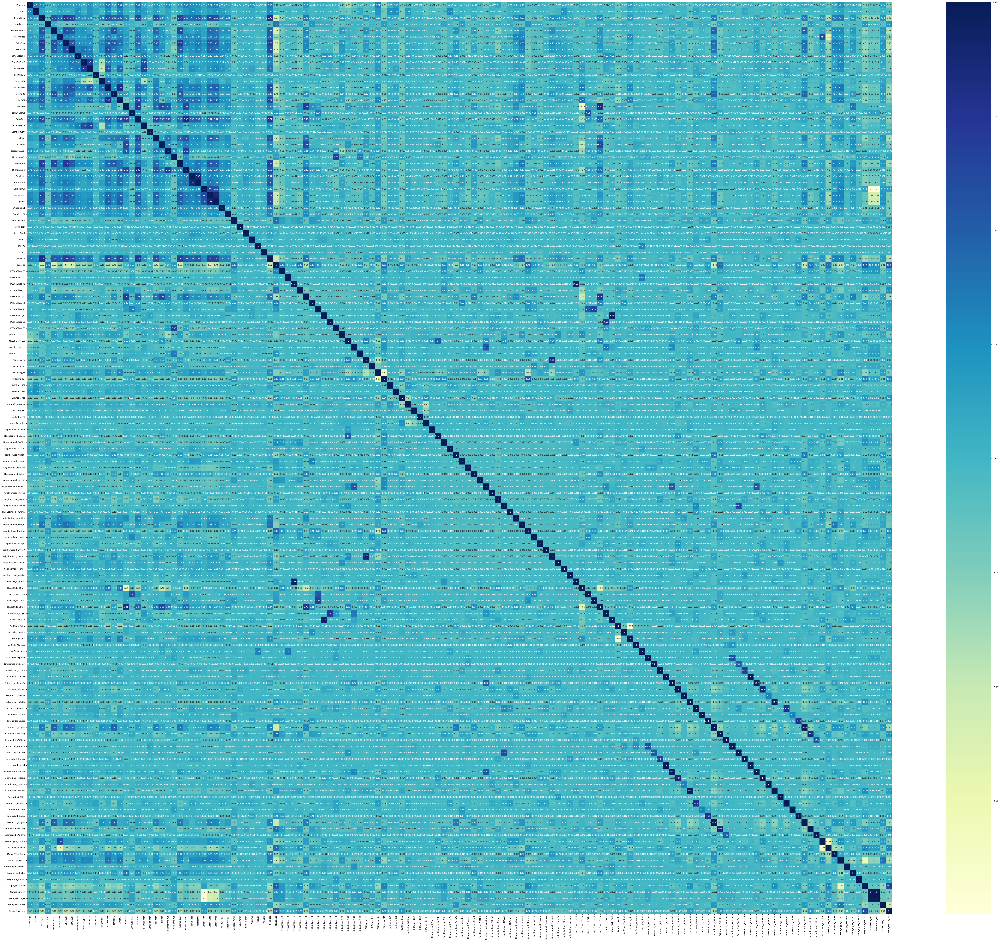

In [99]:
#check the correaltion with new columns with heatmap
plt.figure(figsize=(100,85))
sns.heatmap(house_data.corr(), annot =True, cmap="YlGnBu")
plt.show()

### Prepairing Data For Modeling

In [77]:
df_train,df_test = train_test_split(house_data,train_size=0.70,random_state=100)
print(df_train.shape)
print(df_test.shape)

(1021, 144)
(439, 144)


In [78]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,102

### Rescalling The Numeric Factors

In [79]:
#instantiate the object
scaler = StandardScaler()

#create list of numeric variables
num_vars = ['LotFrontage','LotArea','OverallQual','OverallCond','YearRemodAdd','MasVnrArea', 'ExterQual', 'BsmtQual'
            , 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'TotalBsmtSF'
           , 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath'
            , 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces'
           , 'FireplaceQu', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch'
           , '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'HouseAge']

#fit on data
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
318,0.925326,-0.057261,0.648310,-0.532073,0.389207,0.809137,1.051361,0.577925,2.181065,1.138412,1.159065,-0.293313,-0.454262,0.621091,0.871757,0.511410,2.137583,-0.124502,2.121655,1.066863,-0.247791,0.784821,1.244440,1.395790,-0.234155,0.741868,1.555150,0.622148,0.658513,0.274068,1.646935,0.867501,1.988123,0.195951,1.912645,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,260000,-0.675791,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
239,-0.795709,-0.169753,-0.066511,-1.448170,-1.698692,-0.558025,-0.699764,-0.533302,-0.653302,-0.753845,-0.761831,-0.293313,0.172244,-0.712611,-1.181447,-0.931882,0.793638,-0.124502,-0.058599,-0.837450,-0.247791,-1.028080,1.244440,0.175669,-0.234155,-0.776063,0.308833,0.622148,1.206469,0.177351,-1.034916,-1.188045,-0.744598,1.405086,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.833178,113000,0.939707,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1
986,-0.478677,-0.502762,-0.066511,2.216221,0.874765,-0.558025,-0.699764,-0.533302,-0.653302,-1.226909,-0.964030,-0.293313,-0.175567,-1.257424,-0.154845,-0.421449,0.667284,-0.124502,0.219811,-0.837450,-0.247791,-1.028080,-0.753316,-1.044452,-0.234155,0.741868,-0.937484,-0.927153,-0.985354,0.179549,-1.034916,-1.023035,2.422143,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.105172,117000,1.961757,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

In [80]:
df_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1.021000e+03,1021.000000,1.021000e+03,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,

### Training The Model

In [81]:
#create X_train,y_train 
#cnt is out Target/dependent Variable
y_train = df_train.pop('SalePrice')
X_train = df_train

In [82]:
X_train.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1',
       ...
       'MasVnrType_Stone', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_NA', 'GarageFinish_NA', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=143)

### RFE- Recursive Feature Elimination

___Take Top 35 Features from `RFE`___

In [85]:
#Running RFE with the out variables equals to 15
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select= 35)
rfe = rfe.fit(X_train,y_train)

In [86]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 50),
 ('LotArea', False, 32),
 ('OverallQual', True, 1),
 ('OverallCond', False, 28),
 ('YearRemodAdd', False, 104),
 ('MasVnrArea', False, 35),
 ('ExterQual', False, 38),
 ('BsmtQual', False, 68),
 ('BsmtExposure', False, 19),
 ('BsmtFinType1', False, 33),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('HeatingQC', False, 100),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('LowQualFinSF', True, 1),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 31),
 ('BsmtHalfBath', False, 61),
 ('FullBath', False, 60),
 ('HalfBath', False, 102),
 ('BedroomAbvGr', False, 77),
 ('KitchenAbvGr', False, 48),
 ('KitchenQual', False, 21),
 ('TotRmsAbvGrd', False, 66),
 ('Fireplaces', False, 53),
 ('FireplaceQu', False, 87),
 ('GarageYrBlt', False, 64),
 ('GarageCars', True, 1),
 ('GarageArea', False, 43),
 ('WoodDeckSF', False, 75),
 ('OpenPorchSF', False, 107),
 ('EnclosedPorch', False, 105),
 ('3SsnPorch', False, 6

In [101]:
#selected columns from rfe
col = X_train.columns[rfe.support_]
col

Index(['OverallQual', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR3', 'LotConfig_FR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_AsphShn', 'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_AsphShn', 'Exterior2nd_CBlock', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng', 'GarageType_NA', 'GarageFinish_NA'], dtype='object')

In [102]:
#skipped columns from rfe
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'LotArea', 'OverallCond', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC',
       ...
       'MasVnrType_BrkFace', 'MasVnrType_None', 'MasVnrType_Stone', 'GarageType_Attchd', 'GarageType_Basment', 'GarageType_BuiltIn', 'GarageType_CarPort', 'GarageType_Detchd', 'GarageFinish_RFn', 'GarageFinish_Unf'], dtype='object', length=108)

### Building model using statsmodel, for the detailed statistics

In [103]:
#ceatinf X_train with RFE selected columns
X_train_rfe = X_train[col]

In [104]:
#adding a constant variable
X_train_rfe = sm.add_constant(X_train_rfe)

In [105]:
#create a RFE model
lm = sm.OLS(y_train,X_train_rfe).fit()  #Running the linear Model

In [106]:
#Get the Summary of Linear Model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     150.8
Date:                Tue, 26 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:54:58   Log-Likelihood:                -12087.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     990   BIC:                         2.439e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.577e+05   8345.035     18.900      0.000    1.41e+05    1.74e+05
OverallQual           2.885e+04   1729.809     16.679      0.000    2.55e+04    3.22e+04
BsmtFinSF1            6606.8152    934.999      7.066      0.000    4772.008    8441.622
BsmtFinSF2            1432.9535   1069.630      1.340      0.181    -666.048    3531.955
BsmtUnfSF            -1932.2759    932.381     -2.072      0.038   -3761.946    -102.606
TotalBsmtSF           5337.9846   1383.835      3.857      0.000    2622.399    8053.570
1stFlrSF              8080.9620   1487.493      5.433      0.000    5161.961     1.1e+04
2ndFlrSF              7245.1888   1023.326      7.080      0.000    5237.052    9253.326
LowQualFinSF         -2044.3905   1102.805     -1.854      0.064   -4208.495     119.714
GrLivArea             1.179e+04    914.337     12.898      0.000    9998.740    1.36e+04
GarageCars            1.388e+04   1684.525      8.240      0.000    1.06e+04    1.72e+04
MSSubClass_120        -1.59e+04   4946.530     -3.214      0.001   -2.56e+04   -6191.858
MSSubClass_160       -3.081e+04   5857.068     -5.260      0.000   -4.23e+04   -1.93e+04
MSZoning_RH           1.176e+04   1.25e+04      0.938      0.349   -1.29e+04    3.64e+04
MSZoning_RL           1.795e+04   8280.548      2.167      0.030    1697.659    3.42e+04
MSZoning_RM           7146.1824   8624.921      0.829      0.408   -9779.045    2.41e+04
LotShape_IR3           -2.2e+04   1.17e+04     -1.877      0.061    -4.5e+04     995.462
LotConfig_FR3        -1.284e+04   1.99e+04     -0.645      0.519   -5.19e+04    2.62e+04
Neighborhood_ClearCr   2.78e+04   7889.715      3.524      0.000    1.23e+04    4.33e+04
Neighborhood_Crawfor  3.095e+04   6360.288      4.867      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.975e+04   6678.550      8.947      0.000    4.66e+04    7.29e+04
Neighborhood_NridgHt   5.46e+04   5435.423     10.046      0.000    4.39e+04    6.53e+04
Neighborhood_Somerst  3.913e+04   7999.926      4.891      0.000    2.34e+04    5.48e+04
Neighborhood_StoneBr  3.469e+04   1.02e+04      3.386      0.001    1.46e+04    5.48e+04
Neighborhood_Veenker    3.7e+04   1.06e+04      3.502      0.000    1.63e+04    5.77e+04
Exterior1st_AsphShn  -1.614e+04   1.75e+04     -0.921      0.357   -5.05e+04    1.82e+04
Exterior1st_CBlock   -1646.4916   1.71e+04     -0.096      0.923   -3.52e+04    3.19e+04
Exterior1st_CemntBd   8418.5534   5990.072      1.405      0.160   -3336.142    2.02e+04
Exterior1st_ImStucc   -9.26e+04   3.69e+04     -2.506      0.012   -1.65e+05   -2.01e+04
Exterior2nd_AsphShn  -1.614e+04   1.75e+04     -0.921      0.357   -5.05e+04    1.82e+04
Exterior2nd_CBlock   -1646.4916   1.71e+04     -0.096      0.923   -3.52e+04    3.19e+04
Exterior2nd_ImStucc   2.871e+04    1.3e+04      2.201    

In [107]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_rfe.columns
vif['VIF'] = [variance_inflation_factor(X_train_rfe.values, i) for i in range(X_train_rfe.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
35,GarageFinish_NA,inf
25,Exterior1st_AsphShn,inf
2,BsmtFinSF1,inf
3,BsmtFinSF2,inf
4,BsmtUnfSF,inf
5,TotalBsmtSF,inf
6,1stFlrSF,inf
7,2ndFlrSF,inf
8,LowQualFinSF,inf
9,GrLivArea,inf


___Exterior2nd_CBlock has higher p-value. Lets drop it.___

In [108]:
X_train_new = X_train_rfe.drop(['Exterior2nd_CBlock'],axis=1)

In [109]:
X_train_new.columns

Index(['const', 'OverallQual', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR3', 'LotConfig_FR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_AsphShn', 'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_AsphShn', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng', 'GarageType_NA', 'GarageFinish_NA'], dtype='object')

___Rebuild the model without Exterior2nd_CBlock___

In [110]:
X_train_lm = sm.add_constant(X_train_new)

In [111]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [112]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     150.8
Date:                Tue, 26 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:55:37   Log-Likelihood:                -12087.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     990   BIC:                         2.439e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.577e+05   8345.035     18.900      0.000    1.41e+05    1.74e+05
OverallQual           2.885e+04   1729.809     16.679      0.000    2.55e+04    3.22e+04
BsmtFinSF1            6606.8152    934.999      7.066      0.000    4772.008    8441.622
BsmtFinSF2            1432.9535   1069.630      1.340      0.181    -666.048    3531.955
BsmtUnfSF            -1932.2759    932.381     -2.072      0.038   -3761.946    -102.606
TotalBsmtSF           5337.9846   1383.835      3.857      0.000    2622.399    8053.570
1stFlrSF              8080.9620   1487.493      5.433      0.000    5161.961     1.1e+04
2ndFlrSF              7245.1888   1023.326      7.080      0.000    5237.052    9253.326
LowQualFinSF         -2044.3905   1102.805     -1.854      0.064   -4208.495     119.714
GrLivArea             1.179e+04    914.337     12.898      0.000    9998.740    1.36e+04
GarageCars            1.388e+04   1684.525      8.240      0.000    1.06e+04    1.72e+04
MSSubClass_120        -1.59e+04   4946.530     -3.214      0.001   -2.56e+04   -6191.858
MSSubClass_160       -3.081e+04   5857.068     -5.260      0.000   -4.23e+04   -1.93e+04
MSZoning_RH           1.176e+04   1.25e+04      0.938      0.349   -1.29e+04    3.64e+04
MSZoning_RL           1.795e+04   8280.548      2.167      0.030    1697.659    3.42e+04
MSZoning_RM           7146.1824   8624.921      0.829      0.408   -9779.045    2.41e+04
LotShape_IR3           -2.2e+04   1.17e+04     -1.877      0.061    -4.5e+04     995.462
LotConfig_FR3        -1.284e+04   1.99e+04     -0.645      0.519   -5.19e+04    2.62e+04
Neighborhood_ClearCr   2.78e+04   7889.715      3.524      0.000    1.23e+04    4.33e+04
Neighborhood_Crawfor  3.095e+04   6360.288      4.867      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.975e+04   6678.550      8.947      0.000    4.66e+04    7.29e+04
Neighborhood_NridgHt   5.46e+04   5435.423     10.046      0.000    4.39e+04    6.53e+04
Neighborhood_Somerst  3.913e+04   7999.926      4.891      0.000    2.34e+04    5.48e+04
Neighborhood_StoneBr  3.469e+04   1.02e+04      3.386      0.001    1.46e+04    5.48e+04
Neighborhood_Veenker    3.7e+04   1.06e+04      3.502      0.000    1.63e+04    5.77e+04
Exterior1st_AsphShn  -1.614e+04   1.75e+04     -0.921      0.357   -5.05e+04    1.82e+04
Exterior1st_CBlock   -3292.9831   3.42e+04     -0.096      0.923   -7.03e+04    6.37e+04
Exterior1st_CemntBd   8418.5534   5990.072      1.405      0.160   -3336.142    2.02e+04
Exterior1st_ImStucc   -9.26e+04   3.69e+04     -2.506      0.012   -1.65e+05   -2.01e+04
Exterior2nd_AsphShn  -1.614e+04   1.75e+04     -0.921      0.357   -5.05e+04    1.82e+04
Exterior2nd_ImStucc   2.871e+04    1.3e+04      2.201      0.028    3117.725    5.43e+04
Exterior2nd_Stucco   -3.315e+04   7927.268     -4.181    

___Exterior1st_CBlock has higher p-value. Lets drop it.___

In [113]:
X_train_new = X_train_new.drop(['Exterior1st_CBlock'],axis=1)

___Rebuild the model without Exterior1st_CBlock___

In [114]:
X_train_lm = sm.add_constant(X_train_new)

In [115]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [116]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     156.2
Date:                Tue, 26 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:56:11   Log-Likelihood:                -12087.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     991   BIC:                         2.438e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.577e+05   8340.720     18.910      0.000    1.41e+05    1.74e+05
OverallQual           2.886e+04   1726.652     16.714      0.000    2.55e+04    3.22e+04
BsmtFinSF1            6605.3717    934.411      7.069      0.000    4771.719    8439.024
BsmtFinSF2            1431.6947   1069.015      1.339      0.181    -666.098    3529.488
BsmtUnfSF            -1934.1266    931.717     -2.076      0.038   -3762.492    -105.761
TotalBsmtSF           5334.2448   1382.599      3.858      0.000    2621.086    8047.403
1stFlrSF              8084.2351   1486.362      5.439      0.000    5167.457     1.1e+04
2ndFlrSF              7240.4402   1021.629      7.087      0.000    5235.635    9245.245
LowQualFinSF         -2043.7729   1102.235     -1.854      0.064   -4206.756     119.211
GrLivArea             1.179e+04    913.767     12.904      0.000    9998.476    1.36e+04
GarageCars            1.389e+04   1682.852      8.251      0.000    1.06e+04    1.72e+04
MSSubClass_120        -1.59e+04   4943.755     -3.217      0.001   -2.56e+04   -6202.590
MSSubClass_160        -3.08e+04   5853.963     -5.262      0.000   -4.23e+04   -1.93e+04
MSZoning_RH           1.176e+04   1.25e+04      0.938      0.348   -1.28e+04    3.64e+04
MSZoning_RL           1.794e+04   8275.789      2.167      0.030    1697.253    3.42e+04
MSZoning_RM           7144.1239   8620.583      0.829      0.407   -9772.569    2.41e+04
LotShape_IR3         -2.199e+04   1.17e+04     -1.878      0.061    -4.5e+04     988.495
LotConfig_FR3        -1.284e+04   1.99e+04     -0.645      0.519   -5.19e+04    2.62e+04
Neighborhood_ClearCr  2.781e+04   7885.380      3.527      0.000    1.23e+04    4.33e+04
Neighborhood_Crawfor  3.096e+04   6356.998      4.870      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.975e+04   6675.210      8.951      0.000    4.67e+04    7.29e+04
Neighborhood_NridgHt  5.459e+04   5431.882     10.050      0.000    4.39e+04    6.53e+04
Neighborhood_Somerst  3.912e+04   7995.016      4.893      0.000    2.34e+04    5.48e+04
Neighborhood_StoneBr  3.468e+04   1.02e+04      3.387      0.001    1.46e+04    5.48e+04
Neighborhood_Veenker    3.7e+04   1.06e+04      3.503      0.000    1.63e+04    5.77e+04
Exterior1st_AsphShn  -1.615e+04   1.75e+04     -0.922      0.357   -5.05e+04    1.82e+04
Exterior1st_CemntBd   8417.4985   5987.067      1.406      0.160   -3331.286    2.02e+04
Exterior1st_ImStucc  -9.262e+04   3.69e+04     -2.508      0.012   -1.65e+05   -2.02e+04
Exterior2nd_AsphShn  -1.615e+04   1.75e+04     -0.922      0.357   -5.05e+04    1.82e+04
Exterior2nd_ImStucc   2.871e+04    1.3e+04      2.203      0.028    3134.766    5.43e+04
Exterior2nd_Stucco   -3.314e+04   7923.125     -4.183      0.000   -4.87e+04   -1.76e+04
Exterior2nd_Wd Shng  -1.839e+04   6254.297     -2.940    

___LotConfig_FR3 has higher p-value. Lets drop it.___

In [117]:
X_train_new = X_train_new.drop(['LotConfig_FR3'],axis=1)

___Rebuild the model without LotConfig_FR3___

In [118]:
X_train_lm = sm.add_constant(X_train_new)

In [119]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [120]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     161.8
Date:                Tue, 26 Sep 2023   Prob (F-statistic):               0.00
Time:                        23:58:04   Log-Likelihood:                -12087.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     992   BIC:                         2.438e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.576e+05   8336.795     18.907      0.000    1.41e+05    1.74e+05
OverallQual           2.887e+04   1726.115     16.723      0.000    2.55e+04    3.23e+04
BsmtFinSF1            6602.6505    934.127      7.068      0.000    4769.559    8435.742
BsmtFinSF2            1434.6619   1068.691      1.342      0.180    -662.492    3531.816
BsmtUnfSF            -1922.5277    931.270     -2.064      0.039   -3750.013     -95.043
TotalBsmtSF           5343.9293   1382.111      3.866      0.000    2631.732    8056.126
1stFlrSF              8085.2206   1485.924      5.441      0.000    5169.306     1.1e+04
2ndFlrSF              7236.8202   1021.313      7.086      0.000    5232.638    9241.002
LowQualFinSF         -2038.6375   1101.882     -1.850      0.065   -4200.926     123.651
GrLivArea             1.179e+04    913.495     12.906      0.000    9997.252    1.36e+04
GarageCars            1.388e+04   1682.335      8.251      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.604e+04   4937.876     -3.248      0.001   -2.57e+04   -6349.080
MSSubClass_160       -3.093e+04   5849.023     -5.288      0.000   -4.24e+04   -1.95e+04
MSZoning_RH           1.187e+04   1.25e+04      0.948      0.344   -1.27e+04    3.65e+04
MSZoning_RL           1.806e+04   8271.195      2.183      0.029    1828.289    3.43e+04
MSZoning_RM           7093.6029   8617.691      0.823      0.411   -9817.394     2.4e+04
LotShape_IR3         -2.201e+04   1.17e+04     -1.880      0.060    -4.5e+04     967.358
Neighborhood_ClearCr   2.78e+04   7883.030      3.526      0.000    1.23e+04    4.33e+04
Neighborhood_Crawfor  3.094e+04   6355.070      4.869      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.972e+04   6673.115      8.950      0.000    4.66e+04    7.28e+04
Neighborhood_NridgHt  5.436e+04   5418.731     10.033      0.000    4.37e+04     6.5e+04
Neighborhood_Somerst  3.899e+04   7990.403      4.880      0.000    2.33e+04    5.47e+04
Neighborhood_StoneBr  3.471e+04   1.02e+04      3.390      0.001    1.46e+04    5.48e+04
Neighborhood_Veenker  3.701e+04   1.06e+04      3.505      0.000    1.63e+04    5.77e+04
Exterior1st_AsphShn  -1.615e+04   1.75e+04     -0.923      0.356   -5.05e+04    1.82e+04
Exterior1st_CemntBd   8557.6385   5981.366      1.431      0.153   -3179.945    2.03e+04
Exterior1st_ImStucc  -9.266e+04   3.69e+04     -2.510      0.012   -1.65e+05   -2.02e+04
Exterior2nd_AsphShn  -1.615e+04   1.75e+04     -0.923      0.356   -5.05e+04    1.82e+04
Exterior2nd_ImStucc   2.876e+04    1.3e+04      2.207      0.028    3191.927    5.43e+04
Exterior2nd_Stucco   -3.309e+04   7920.465     -4.178      0.000   -4.86e+04   -1.76e+04
Exterior2nd_Wd Shng   -1.83e+04   6250.910     -2.927      0.004   -3.06e+04   -6029.426
GarageType_NA         1.052e+04   3003.562      3.502    

___MSZoning_RM has higher p-value. Lets drop it.___

In [121]:
X_train_new = X_train_new.drop(['MSZoning_RM'],axis=1)

___Rebuild the model without MSZoning_RM___

In [122]:
X_train_lm = sm.add_constant(X_train_new)

In [123]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [124]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     167.8
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:00:57   Log-Likelihood:                -12087.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     993   BIC:                         2.437e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  1.64e+05   3043.491     53.890      0.000    1.58e+05     1.7e+05
OverallQual           2.896e+04   1721.779     16.822      0.000    2.56e+04    3.23e+04
BsmtFinSF1            6563.3852    932.757      7.037      0.000    4732.984    8393.786
BsmtFinSF2            1437.4616   1068.512      1.345      0.179    -659.339    3534.262
BsmtUnfSF            -1893.7841    930.464     -2.035      0.042   -3719.685     -67.883
TotalBsmtSF           5333.2863   1381.826      3.860      0.000    2621.652    8044.921
1stFlrSF              8109.4293   1485.391      5.459      0.000    5194.563     1.1e+04
2ndFlrSF              7188.7420   1019.476      7.051      0.000    5188.167    9189.317
LowQualFinSF         -2086.8601   1100.145     -1.897      0.058   -4245.737      72.017
GrLivArea             1.176e+04    912.816     12.888      0.000    9972.959    1.36e+04
GarageCars            1.389e+04   1682.041      8.256      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.607e+04   4936.961     -3.254      0.001   -2.58e+04   -6378.425
MSSubClass_160       -3.125e+04   5834.737     -5.357      0.000   -4.27e+04   -1.98e+04
MSZoning_RH           5581.7332   9925.618      0.562      0.574   -1.39e+04    2.51e+04
MSZoning_RL           1.177e+04   3179.929      3.703      0.000    5534.251     1.8e+04
LotShape_IR3         -2.201e+04   1.17e+04     -1.880      0.060    -4.5e+04     963.170
Neighborhood_ClearCr  2.775e+04   7881.536      3.521      0.000    1.23e+04    4.32e+04
Neighborhood_Crawfor  3.083e+04   6352.576      4.853      0.000    1.84e+04    4.33e+04
Neighborhood_NoRidge   5.96e+04   6670.419      8.936      0.000    4.65e+04    7.27e+04
Neighborhood_NridgHt  5.408e+04   5407.057     10.002      0.000    4.35e+04    6.47e+04
Neighborhood_Somerst  3.412e+04   5361.622      6.363      0.000    2.36e+04    4.46e+04
Neighborhood_StoneBr  3.437e+04   1.02e+04      3.361      0.001    1.43e+04    5.44e+04
Neighborhood_Veenker  3.685e+04   1.06e+04      3.492      0.001    1.61e+04    5.76e+04
Exterior1st_AsphShn   -1.62e+04   1.75e+04     -0.926      0.355   -5.05e+04    1.81e+04
Exterior1st_CemntBd   9100.8590   5943.884      1.531      0.126   -2563.156    2.08e+04
Exterior1st_ImStucc  -9.285e+04   3.69e+04     -2.516      0.012   -1.65e+05   -2.04e+04
Exterior2nd_AsphShn   -1.62e+04   1.75e+04     -0.926      0.355   -5.05e+04    1.81e+04
Exterior2nd_ImStucc   2.888e+04    1.3e+04      2.217      0.027    3317.954    5.44e+04
Exterior2nd_Stucco   -3.281e+04   7911.388     -4.147      0.000   -4.83e+04   -1.73e+04
Exterior2nd_Wd Shng  -1.808e+04   6244.278     -2.895      0.004   -3.03e+04   -5824.361
GarageType_NA         1.051e+04   3003.063      3.501      0.000    4619.452    1.64e+04
GarageFinish_NA       1.051e+04   3003.063      3.501    

___MSZoning_RH has higher p-value. Lets drop it.___

In [125]:
X_train_new = X_train_new.drop(['MSZoning_RH'],axis=1)

___Rebuild the model without MSZoning_RH___

In [126]:
X_train_lm = sm.add_constant(X_train_new)

In [127]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [128]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     174.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:01:42   Log-Likelihood:                -12088.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     994   BIC:                         2.436e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.644e+05   2957.547     55.592      0.000    1.59e+05     1.7e+05
OverallQual           2.895e+04   1721.110     16.823      0.000    2.56e+04    3.23e+04
BsmtFinSF1            6560.9324    932.426      7.036      0.000    4731.184    8390.681
BsmtFinSF2            1423.5032   1067.856      1.333      0.183    -672.008    3519.014
BsmtUnfSF            -1908.4001    929.781     -2.053      0.040   -3732.959     -83.842
TotalBsmtSF           5311.3207   1380.799      3.847      0.000    2601.705    8020.936
1stFlrSF              8155.9752   1482.573      5.501      0.000    5246.642    1.11e+04
2ndFlrSF              7189.7362   1019.124      7.055      0.000    5189.855    9189.617
LowQualFinSF         -2068.9488   1099.306     -1.882      0.060   -4226.176      88.278
GrLivArea              1.18e+04    910.095     12.967      0.000       1e+04    1.36e+04
GarageCars            1.386e+04   1680.509      8.245      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.597e+04   4932.577     -3.239      0.001   -2.57e+04   -6295.455
MSSubClass_160       -3.146e+04   5821.644     -5.403      0.000   -4.29e+04      -2e+04
MSZoning_RL           1.137e+04   3095.807      3.672      0.000    5293.296    1.74e+04
LotShape_IR3         -2.209e+04   1.17e+04     -1.888      0.059   -4.51e+04     873.603
Neighborhood_ClearCr  2.772e+04   7878.588      3.518      0.000    1.23e+04    4.32e+04
Neighborhood_Crawfor  3.093e+04   6347.790      4.873      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.956e+04   6667.755      8.933      0.000    4.65e+04    7.26e+04
Neighborhood_NridgHt  5.411e+04   5405.040     10.010      0.000    4.35e+04    6.47e+04
Neighborhood_Somerst  3.393e+04   5349.657      6.343      0.000    2.34e+04    4.44e+04
Neighborhood_StoneBr  3.439e+04   1.02e+04      3.364      0.001    1.43e+04    5.45e+04
Neighborhood_Veenker  3.686e+04   1.06e+04      3.493      0.000    1.62e+04    5.76e+04
Exterior1st_AsphShn  -1.641e+04   1.75e+04     -0.938      0.348   -5.07e+04    1.79e+04
Exterior1st_CemntBd   8902.2075   5931.336      1.501      0.134   -2737.171    2.05e+04
Exterior1st_ImStucc  -9.273e+04   3.69e+04     -2.513      0.012   -1.65e+05   -2.03e+04
Exterior2nd_AsphShn  -1.641e+04   1.75e+04     -0.938      0.348   -5.07e+04    1.79e+04
Exterior2nd_ImStucc   2.883e+04    1.3e+04      2.214      0.027    3276.581    5.44e+04
Exterior2nd_Stucco   -3.275e+04   7908.138     -4.142      0.000   -4.83e+04   -1.72e+04
Exterior2nd_Wd Shng  -1.821e+04   6237.452     -2.920      0.004   -3.05e+04   -5973.692
GarageType_NA         1.062e+04   2996.337      3.543      0.000    4736.620    1.65e+04
GarageFinish_NA       1.062e+04   2996.337      3.543      0.000    4736.620    1.65e+04
=========================================================

In [129]:
X_train_new.shape

(1021, 31)

In [130]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
30,GarageFinish_NA,inf
22,Exterior1st_AsphShn,inf
2,BsmtFinSF1,inf
3,BsmtFinSF2,inf
4,BsmtUnfSF,inf
5,TotalBsmtSF,inf
6,1stFlrSF,inf
7,2ndFlrSF,inf
8,LowQualFinSF,inf
9,GrLivArea,inf


___Exterior1st_AsphShn has higher p-value and VIF. Lets drop it.___

In [131]:
X_train_new = X_train_new.drop(['Exterior1st_AsphShn'],axis=1)

___Rebuild the model without Exterior1st_AsphShn___

In [132]:
X_train_lm = sm.add_constant(X_train_new)

In [133]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [134]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     174.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:04:46   Log-Likelihood:                -12088.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     994   BIC:                         2.436e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.644e+05   2957.547     55.592      0.000    1.59e+05     1.7e+05
OverallQual           2.895e+04   1721.110     16.823      0.000    2.56e+04    3.23e+04
BsmtFinSF1            6560.9324    932.426      7.036      0.000    4731.184    8390.681
BsmtFinSF2            1423.5032   1067.856      1.333      0.183    -672.008    3519.014
BsmtUnfSF            -1908.4001    929.781     -2.053      0.040   -3732.959     -83.842
TotalBsmtSF           5311.3207   1380.799      3.847      0.000    2601.705    8020.936
1stFlrSF              8155.9752   1482.573      5.501      0.000    5246.642    1.11e+04
2ndFlrSF              7189.7362   1019.124      7.055      0.000    5189.855    9189.617
LowQualFinSF         -2068.9488   1099.306     -1.882      0.060   -4226.176      88.278
GrLivArea              1.18e+04    910.095     12.967      0.000       1e+04    1.36e+04
GarageCars            1.386e+04   1680.509      8.245      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.597e+04   4932.577     -3.239      0.001   -2.57e+04   -6295.455
MSSubClass_160       -3.146e+04   5821.644     -5.403      0.000   -4.29e+04      -2e+04
MSZoning_RL           1.137e+04   3095.807      3.672      0.000    5293.296    1.74e+04
LotShape_IR3         -2.209e+04   1.17e+04     -1.888      0.059   -4.51e+04     873.603
Neighborhood_ClearCr  2.772e+04   7878.588      3.518      0.000    1.23e+04    4.32e+04
Neighborhood_Crawfor  3.093e+04   6347.790      4.873      0.000    1.85e+04    4.34e+04
Neighborhood_NoRidge  5.956e+04   6667.755      8.933      0.000    4.65e+04    7.26e+04
Neighborhood_NridgHt  5.411e+04   5405.040     10.010      0.000    4.35e+04    6.47e+04
Neighborhood_Somerst  3.393e+04   5349.657      6.343      0.000    2.34e+04    4.44e+04
Neighborhood_StoneBr  3.439e+04   1.02e+04      3.364      0.001    1.43e+04    5.45e+04
Neighborhood_Veenker  3.686e+04   1.06e+04      3.493      0.000    1.62e+04    5.76e+04
Exterior1st_CemntBd   8902.2075   5931.336      1.501      0.134   -2737.171    2.05e+04
Exterior1st_ImStucc  -9.273e+04   3.69e+04     -2.513      0.012   -1.65e+05   -2.03e+04
Exterior2nd_AsphShn  -3.282e+04    3.5e+04     -0.938      0.348   -1.01e+05    3.58e+04
Exterior2nd_ImStucc   2.883e+04    1.3e+04      2.214      0.027    3276.581    5.44e+04
Exterior2nd_Stucco   -3.275e+04   7908.138     -4.142      0.000   -4.83e+04   -1.72e+04
Exterior2nd_Wd Shng  -1.821e+04   6237.452     -2.920      0.004   -3.05e+04   -5973.692
GarageType_NA         1.062e+04   2996.337      3.543      0.000    4736.620    1.65e+04
GarageFinish_NA       1.062e+04   2996.337      3.543      0.000    4736.620    1.65e+04
==============================================================================
Omnibus:                      298.630   Durbin-Watson:             

In [135]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
29,GarageFinish_NA,inf
28,GarageType_NA,inf
2,BsmtFinSF1,inf
3,BsmtFinSF2,inf
4,BsmtUnfSF,inf
5,TotalBsmtSF,inf
6,1stFlrSF,inf
7,2ndFlrSF,inf
8,LowQualFinSF,inf
9,GrLivArea,inf


___Exterior2nd_AsphShn has higher p-value. Lets drop it.___

In [136]:
X_train_new = X_train_new.drop(['Exterior2nd_AsphShn'],axis=1)

___Rebuild the model without Exterior2nd_AsphShn___

In [137]:
X_train_lm = sm.add_constant(X_train_new)

In [138]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [139]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.816
Method:                 Least Squares   F-statistic:                     181.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:07:33   Log-Likelihood:                -12088.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     995   BIC:                         2.436e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.645e+05   2956.753     55.626      0.000    1.59e+05     1.7e+05
OverallQual           2.889e+04   1719.742     16.801      0.000    2.55e+04    3.23e+04
BsmtFinSF1            6670.0807    925.085      7.210      0.000    4854.740    8485.422
BsmtFinSF2            1466.1196   1066.825      1.374      0.170    -627.366    3559.605
BsmtUnfSF            -1795.2123    921.866     -1.947      0.052   -3604.237      13.812
TotalBsmtSF           5548.3926   1357.402      4.088      0.000    2884.694    8212.091
1stFlrSF              7910.0577   1459.133      5.421      0.000    5046.726    1.08e+04
2ndFlrSF              7294.0788   1012.977      7.201      0.000    5306.263    9281.895
LowQualFinSF         -2034.3562   1098.621     -1.852      0.064   -4190.237     121.525
GrLivArea             1.171e+04    904.342     12.944      0.000    9931.448    1.35e+04
GarageCars            1.389e+04   1679.945      8.269      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.599e+04   4932.240     -3.243      0.001   -2.57e+04   -6314.847
MSSubClass_160       -3.156e+04   5820.319     -5.422      0.000    -4.3e+04   -2.01e+04
MSZoning_RL            1.13e+04   3094.815      3.652      0.000    5228.976    1.74e+04
LotShape_IR3         -2.225e+04   1.17e+04     -1.902      0.057   -4.52e+04     707.958
Neighborhood_ClearCr  2.772e+04   7878.111      3.519      0.000    1.23e+04    4.32e+04
Neighborhood_Crawfor  3.102e+04   6346.631      4.888      0.000    1.86e+04    4.35e+04
Neighborhood_NoRidge  5.954e+04   6667.316      8.931      0.000    4.65e+04    7.26e+04
Neighborhood_NridgHt  5.408e+04   5404.617     10.005      0.000    4.35e+04    6.47e+04
Neighborhood_Somerst  3.386e+04   5348.719      6.330      0.000    2.34e+04    4.44e+04
Neighborhood_StoneBr  3.442e+04   1.02e+04      3.368      0.001    1.44e+04    5.45e+04
Neighborhood_Veenker  3.689e+04   1.06e+04      3.496      0.000    1.62e+04    5.76e+04
Exterior1st_CemntBd   8956.5826   5930.696      1.510      0.131   -2681.526    2.06e+04
Exterior1st_ImStucc   -9.27e+04   3.69e+04     -2.513      0.012   -1.65e+05   -2.03e+04
Exterior2nd_ImStucc   2.883e+04    1.3e+04      2.214      0.027    3276.030    5.44e+04
Exterior2nd_Stucco   -3.276e+04   7907.660     -4.143      0.000   -4.83e+04   -1.72e+04
Exterior2nd_Wd Shng  -1.808e+04   6235.533     -2.900      0.004   -3.03e+04   -5847.253
GarageType_NA         1.033e+04   2980.123      3.465      0.001    4477.989    1.62e+04
GarageFinish_NA       1.033e+04   2980.123      3.465      0.001    4477.989    1.62e+04
==============================================================================
Omnibus:                      299.174   Durbin-Watson:                   2.070
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            26709.88

In [140]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
28,GarageFinish_NA,inf
27,GarageType_NA,inf
2,BsmtFinSF1,inf
3,BsmtFinSF2,inf
4,BsmtUnfSF,inf
5,TotalBsmtSF,inf
6,1stFlrSF,inf
7,2ndFlrSF,inf
8,LowQualFinSF,inf
9,GrLivArea,inf


___GarageFinish_NA has higher VIF. Lets drop it.___

In [141]:
X_train_new = X_train_new.drop(['GarageFinish_NA'],axis=1)

___Rebuild the model without GarageFinish_NA___

In [142]:
X_train_lm = sm.add_constant(X_train_new)

In [143]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [144]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.816
Method:                 Least Squares   F-statistic:                     181.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:08:48   Log-Likelihood:                -12088.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                     995   BIC:                         2.436e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.645e+05   2956.753     55.626      0.000    1.59e+05     1.7e+05
OverallQual           2.889e+04   1719.742     16.801      0.000    2.55e+04    3.23e+04
BsmtFinSF1            6670.0807    925.085      7.210      0.000    4854.740    8485.422
BsmtFinSF2            1466.1196   1066.825      1.374      0.170    -627.366    3559.605
BsmtUnfSF            -1795.2123    921.866     -1.947      0.052   -3604.237      13.812
TotalBsmtSF           5548.3926   1357.402      4.088      0.000    2884.694    8212.091
1stFlrSF              7910.0577   1459.133      5.421      0.000    5046.726    1.08e+04
2ndFlrSF              7294.0788   1012.977      7.201      0.000    5306.263    9281.895
LowQualFinSF         -2034.3562   1098.621     -1.852      0.064   -4190.237     121.525
GrLivArea             1.171e+04    904.342     12.944      0.000    9931.448    1.35e+04
GarageCars            1.389e+04   1679.945      8.269      0.000    1.06e+04    1.72e+04
MSSubClass_120       -1.599e+04   4932.240     -3.243      0.001   -2.57e+04   -6314.847
MSSubClass_160       -3.156e+04   5820.319     -5.422      0.000    -4.3e+04   -2.01e+04
MSZoning_RL            1.13e+04   3094.815      3.652      0.000    5228.976    1.74e+04
LotShape_IR3         -2.225e+04   1.17e+04     -1.902      0.057   -4.52e+04     707.958
Neighborhood_ClearCr  2.772e+04   7878.111      3.519      0.000    1.23e+04    4.32e+04
Neighborhood_Crawfor  3.102e+04   6346.631      4.888      0.000    1.86e+04    4.35e+04
Neighborhood_NoRidge  5.954e+04   6667.316      8.931      0.000    4.65e+04    7.26e+04
Neighborhood_NridgHt  5.408e+04   5404.617     10.005      0.000    4.35e+04    6.47e+04
Neighborhood_Somerst  3.386e+04   5348.719      6.330      0.000    2.34e+04    4.44e+04
Neighborhood_StoneBr  3.442e+04   1.02e+04      3.368      0.001    1.44e+04    5.45e+04
Neighborhood_Veenker  3.689e+04   1.06e+04      3.496      0.000    1.62e+04    5.76e+04
Exterior1st_CemntBd   8956.5826   5930.696      1.510      0.131   -2681.526    2.06e+04
Exterior1st_ImStucc   -9.27e+04   3.69e+04     -2.513      0.012   -1.65e+05   -2.03e+04
Exterior2nd_ImStucc   2.883e+04    1.3e+04      2.214      0.027    3276.030    5.44e+04
Exterior2nd_Stucco   -3.276e+04   7907.660     -4.143      0.000   -4.83e+04   -1.72e+04
Exterior2nd_Wd Shng  -1.808e+04   6235.533     -2.900      0.004   -3.03e+04   -5847.253
GarageType_NA         2.065e+04   5960.245      3.465      0.001    8955.977    3.23e+04
==============================================================================
Omnibus:                      299.174   Durbin-Watson:                   2.070
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            26709.880
Skew:                          -0.227   Prob(JB):                         0.00
Kurtosis

___GarageType_NA has higher VIF. Lets drop it.___

In [145]:
X_train_new = X_train_new.drop(['GarageType_NA'],axis=1)

___Rebuild the model without GarageType_NA___

In [146]:
X_train_lm = sm.add_constant(X_train_new)

In [147]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [148]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     186.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:11:09   Log-Likelihood:                -12094.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     996   BIC:                         2.436e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.655e+05   2958.136     55.947      0.000     1.6e+05    1.71e+05
OverallQual           2.887e+04   1729.199     16.693      0.000    2.55e+04    3.23e+04
BsmtFinSF1            6666.8639    930.181      7.167      0.000    4841.524    8492.204
BsmtFinSF2            1237.5055   1070.650      1.156      0.248    -863.483    3338.494
BsmtUnfSF            -1633.0318    925.750     -1.764      0.078   -3449.676     183.612
TotalBsmtSF           5618.5790   1364.729      4.117      0.000    2940.505    8296.653
1stFlrSF              8187.4881   1464.962      5.589      0.000    5312.721    1.11e+04
2ndFlrSF              7408.3329   1018.019      7.277      0.000    5410.626    9406.040
LowQualFinSF         -1590.6024   1097.143     -1.450      0.147   -3743.580     562.375
GrLivArea             1.205e+04    903.914     13.328      0.000    1.03e+04    1.38e+04
GarageCars             1.06e+04   1392.980      7.609      0.000    7865.955    1.33e+04
MSSubClass_120       -1.647e+04   4957.477     -3.323      0.001   -2.62e+04   -6743.175
MSSubClass_160       -3.265e+04   5843.765     -5.587      0.000   -4.41e+04   -2.12e+04
MSZoning_RL           1.121e+04   3111.754      3.603      0.000    5104.275    1.73e+04
LotShape_IR3         -2.236e+04   1.18e+04     -1.901      0.058   -4.54e+04     725.817
Neighborhood_ClearCr   2.77e+04   7921.516      3.497      0.000    1.22e+04    4.32e+04
Neighborhood_Crawfor  2.921e+04   6359.826      4.593      0.000    1.67e+04    4.17e+04
Neighborhood_NoRidge  6.105e+04   6689.766      9.126      0.000    4.79e+04    7.42e+04
Neighborhood_NridgHt  5.626e+04   5397.364     10.423      0.000    4.57e+04    6.68e+04
Neighborhood_Somerst  3.507e+04   5366.679      6.534      0.000    2.45e+04    4.56e+04
Neighborhood_StoneBr  3.561e+04   1.03e+04      3.467      0.001    1.55e+04    5.58e+04
Neighborhood_Veenker  3.768e+04   1.06e+04      3.553      0.000    1.69e+04    5.85e+04
Exterior1st_CemntBd   1.042e+04   5948.222      1.752      0.080   -1251.907    2.21e+04
Exterior1st_ImStucc  -8.859e+04   3.71e+04     -2.389      0.017   -1.61e+05   -1.58e+04
Exterior2nd_ImStucc   2.749e+04   1.31e+04      2.101      0.036    1811.156    5.32e+04
Exterior2nd_Stucco   -3.273e+04   7951.224     -4.116      0.000   -4.83e+04   -1.71e+04
Exterior2nd_Wd Shng  -1.749e+04   6267.518     -2.790      0.005   -2.98e+04   -5190.259
==============================================================================
Omnibus:                      301.751   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            27335.812
Skew:                          -0.244   Prob(JB):                         0.00
Kurtosis:                      28.344   Cond. No.                     4.40e+15
==================

___BsmtFinSF2 has higher p-value. Lets drop it.___

In [149]:
X_train_new = X_train_new.drop(['BsmtFinSF2'],axis=1)

___Rebuild the model without BsmtFinSF2___

In [150]:
X_train_lm = sm.add_constant(X_train_new)

In [151]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [152]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     186.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:12:16   Log-Likelihood:                -12094.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     996   BIC:                         2.436e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.655e+05   2958.136     55.947      0.000     1.6e+05    1.71e+05
OverallQual           2.887e+04   1729.199     16.693      0.000    2.55e+04    3.23e+04
BsmtFinSF1            3297.8791   3124.715      1.055      0.291   -2833.902    9429.660
BsmtUnfSF            -4883.4002   2949.940     -1.655      0.098   -1.07e+04     905.410
TotalBsmtSF           8943.9799   3477.400      2.572      0.010    2120.109    1.58e+04
1stFlrSF              8187.4881   1464.962      5.589      0.000    5312.721    1.11e+04
2ndFlrSF              7408.3329   1018.019      7.277      0.000    5410.626    9406.040
LowQualFinSF         -1590.6024   1097.143     -1.450      0.147   -3743.580     562.375
GrLivArea             1.205e+04    903.914     13.328      0.000    1.03e+04    1.38e+04
GarageCars             1.06e+04   1392.980      7.609      0.000    7865.955    1.33e+04
MSSubClass_120       -1.647e+04   4957.477     -3.323      0.001   -2.62e+04   -6743.175
MSSubClass_160       -3.265e+04   5843.765     -5.587      0.000   -4.41e+04   -2.12e+04
MSZoning_RL           1.121e+04   3111.754      3.603      0.000    5104.275    1.73e+04
LotShape_IR3         -2.236e+04   1.18e+04     -1.901      0.058   -4.54e+04     725.817
Neighborhood_ClearCr   2.77e+04   7921.516      3.497      0.000    1.22e+04    4.32e+04
Neighborhood_Crawfor  2.921e+04   6359.826      4.593      0.000    1.67e+04    4.17e+04
Neighborhood_NoRidge  6.105e+04   6689.766      9.126      0.000    4.79e+04    7.42e+04
Neighborhood_NridgHt  5.626e+04   5397.364     10.423      0.000    4.57e+04    6.68e+04
Neighborhood_Somerst  3.507e+04   5366.679      6.534      0.000    2.45e+04    4.56e+04
Neighborhood_StoneBr  3.561e+04   1.03e+04      3.467      0.001    1.55e+04    5.58e+04
Neighborhood_Veenker  3.768e+04   1.06e+04      3.553      0.000    1.69e+04    5.85e+04
Exterior1st_CemntBd   1.042e+04   5948.222      1.752      0.080   -1251.907    2.21e+04
Exterior1st_ImStucc  -8.859e+04   3.71e+04     -2.389      0.017   -1.61e+05   -1.58e+04
Exterior2nd_ImStucc   2.749e+04   1.31e+04      2.101      0.036    1811.156    5.32e+04
Exterior2nd_Stucco   -3.273e+04   7951.224     -4.116      0.000   -4.83e+04   -1.71e+04
Exterior2nd_Wd Shng  -1.749e+04   6267.518     -2.790      0.005   -2.98e+04   -5190.259
==============================================================================
Omnibus:                      301.751   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            27335.812
Skew:                          -0.244   Prob(JB):                         0.00
Kurtosis:                      28.344   Cond. No.                     2.25e+15
==============================================================================

Notes:
[1] Standard Errors 

___BsmtFinSF1 has higher p-value. Lets drop it.___

In [153]:
X_train_new = X_train_new.drop(['BsmtFinSF1'],axis=1)

___Rebuild the model without BsmtFinSF1___

In [154]:
X_train_lm = sm.add_constant(X_train_new)

In [155]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [156]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     194.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:12:52   Log-Likelihood:                -12095.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     997   BIC:                         2.436e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.655e+05   2958.300     55.945      0.000     1.6e+05    1.71e+05
OverallQual           2.894e+04   1727.966     16.746      0.000    2.55e+04    3.23e+04
BsmtUnfSF            -7714.0604   1228.429     -6.280      0.000   -1.01e+04   -5303.458
TotalBsmtSF           1.188e+04   2082.184      5.707      0.000    7797.559     1.6e+04
1stFlrSF              8146.3412   1464.527      5.562      0.000    5272.432     1.1e+04
2ndFlrSF              7423.5961   1017.974      7.293      0.000    5425.979    9421.213
LowQualFinSF         -1631.4686   1096.522     -1.488      0.137   -3783.225     520.288
GrLivArea             1.203e+04    903.725     13.307      0.000    1.03e+04    1.38e+04
GarageCars            1.063e+04   1392.795      7.631      0.000    7895.012    1.34e+04
MSSubClass_120       -1.636e+04   4956.674     -3.301      0.001   -2.61e+04   -6635.246
MSSubClass_160       -3.284e+04   5841.460     -5.621      0.000   -4.43e+04   -2.14e+04
MSZoning_RL           1.117e+04   3111.664      3.589      0.000    5061.397    1.73e+04
LotShape_IR3         -2.205e+04   1.18e+04     -1.874      0.061   -4.51e+04    1033.958
Neighborhood_ClearCr  2.681e+04   7877.100      3.404      0.001    1.14e+04    4.23e+04
Neighborhood_Crawfor  2.926e+04   6360.036      4.600      0.000    1.68e+04    4.17e+04
Neighborhood_NoRidge  6.154e+04   6674.004      9.221      0.000    4.84e+04    7.46e+04
Neighborhood_NridgHt  5.651e+04   5392.521     10.479      0.000    4.59e+04    6.71e+04
Neighborhood_Somerst  3.524e+04   5364.480      6.569      0.000    2.47e+04    4.58e+04
Neighborhood_StoneBr  3.528e+04   1.03e+04      3.435      0.001    1.51e+04    5.54e+04
Neighborhood_Veenker  3.683e+04   1.06e+04      3.482      0.001    1.61e+04    5.76e+04
Exterior1st_CemntBd   1.063e+04   5945.285      1.788      0.074   -1037.778    2.23e+04
Exterior1st_ImStucc  -8.853e+04   3.71e+04     -2.387      0.017   -1.61e+05   -1.58e+04
Exterior2nd_ImStucc   2.794e+04   1.31e+04      2.136      0.033    2273.023    5.36e+04
Exterior2nd_Stucco   -3.268e+04   7951.576     -4.110      0.000   -4.83e+04   -1.71e+04
Exterior2nd_Wd Shng   -1.74e+04   6267.355     -2.777      0.006   -2.97e+04   -5105.302
==============================================================================
Omnibus:                      295.510   Durbin-Watson:                   2.076
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25909.088
Skew:                          -0.198   Prob(JB):                         0.00
Kurtosis:                      27.675   Cond. No.                     3.84e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest 

In [157]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
4,1stFlrSF,inf
5,2ndFlrSF,inf
6,LowQualFinSF,inf
7,GrLivArea,inf
0,const,7.66
3,TotalBsmtSF,3.79
1,OverallQual,2.61
8,GarageCars,1.70
11,MSZoning_RL,1.43
17,Neighborhood_Somerst,1.39


___1stFlrSF has higher VIF. Lets drop it.___

In [158]:
X_train_new = X_train_new.drop(['1stFlrSF'],axis=1)

___Rebuild the model without 1stFlrSF__

In [159]:
X_train_lm = sm.add_constant(X_train_new)

In [160]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [161]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     194.4
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:23:51   Log-Likelihood:                -12095.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     997   BIC:                         2.436e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.655e+05   2958.300     55.945      0.000     1.6e+05    1.71e+05
OverallQual           2.894e+04   1727.966     16.746      0.000    2.55e+04    3.23e+04
BsmtUnfSF            -7714.0604   1228.429     -6.280      0.000   -1.01e+04   -5303.458
TotalBsmtSF           1.188e+04   2082.184      5.707      0.000    7797.559     1.6e+04
2ndFlrSF             -1492.5912   2342.485     -0.637      0.524   -6089.357    3104.175
LowQualFinSF         -2618.4531   1125.659     -2.326      0.020   -4827.385    -409.521
GrLivArea             2.291e+04   2650.209      8.646      0.000    1.77e+04    2.81e+04
GarageCars            1.063e+04   1392.795      7.631      0.000    7895.012    1.34e+04
MSSubClass_120       -1.636e+04   4956.674     -3.301      0.001   -2.61e+04   -6635.246
MSSubClass_160       -3.284e+04   5841.460     -5.621      0.000   -4.43e+04   -2.14e+04
MSZoning_RL           1.117e+04   3111.664      3.589      0.000    5061.397    1.73e+04
LotShape_IR3         -2.205e+04   1.18e+04     -1.874      0.061   -4.51e+04    1033.958
Neighborhood_ClearCr  2.681e+04   7877.100      3.404      0.001    1.14e+04    4.23e+04
Neighborhood_Crawfor  2.926e+04   6360.036      4.600      0.000    1.68e+04    4.17e+04
Neighborhood_NoRidge  6.154e+04   6674.004      9.221      0.000    4.84e+04    7.46e+04
Neighborhood_NridgHt  5.651e+04   5392.521     10.479      0.000    4.59e+04    6.71e+04
Neighborhood_Somerst  3.524e+04   5364.480      6.569      0.000    2.47e+04    4.58e+04
Neighborhood_StoneBr  3.528e+04   1.03e+04      3.435      0.001    1.51e+04    5.54e+04
Neighborhood_Veenker  3.683e+04   1.06e+04      3.482      0.001    1.61e+04    5.76e+04
Exterior1st_CemntBd   1.063e+04   5945.285      1.788      0.074   -1037.778    2.23e+04
Exterior1st_ImStucc  -8.853e+04   3.71e+04     -2.387      0.017   -1.61e+05   -1.58e+04
Exterior2nd_ImStucc   2.794e+04   1.31e+04      2.136      0.033    2273.023    5.36e+04
Exterior2nd_Stucco   -3.268e+04   7951.576     -4.110      0.000   -4.83e+04   -1.71e+04
Exterior2nd_Wd Shng   -1.74e+04   6267.355     -2.777      0.006   -2.97e+04   -5105.302
==============================================================================
Omnibus:                      295.510   Durbin-Watson:                   2.076
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25909.088
Skew:                          -0.198   Prob(JB):                         0.00
Kurtosis:                      27.675   Cond. No.                         59.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

___2ndFlrSF has higher p-value. Lets drop it.___

In [162]:
X_train_new = X_train_new.drop(['2ndFlrSF'],axis=1)

___Rebuild the model without 2ndFlrSF__

In [163]:
X_train_lm = sm.add_constant(X_train_new)

In [164]:
#Running the Linear Model
lm = sm.OLS(y_train,X_train_lm).fit()

In [165]:
#check the summary of model
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     203.3
Date:                Wed, 27 Sep 2023   Prob (F-statistic):               0.00
Time:                        00:24:34   Log-Likelihood:                -12095.
No. Observations:                1021   AIC:                         2.424e+04
Df Residuals:                     998   BIC:                         2.435e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.653e+05   2945.598     56.129      0.000     1.6e+05    1.71e+05
OverallQual           2.878e+04   1709.299     16.836      0.000    2.54e+04    3.21e+04
BsmtUnfSF            -7746.0506   1227.037     -6.313      0.000   -1.02e+04   -5338.182
TotalBsmtSF           1.281e+04   1493.560      8.575      0.000    9876.766    1.57e+04
LowQualFinSF         -2502.5029   1110.522     -2.253      0.024   -4681.729    -323.277
GrLivArea             2.154e+04   1532.697     14.052      0.000    1.85e+04    2.45e+04
GarageCars             1.07e+04   1387.586      7.712      0.000    7978.816    1.34e+04
MSSubClass_120       -1.607e+04   4933.296     -3.257      0.001   -2.57e+04   -6384.507
MSSubClass_160       -3.345e+04   5760.537     -5.806      0.000   -4.48e+04   -2.21e+04
MSZoning_RL            1.14e+04   3090.182      3.688      0.000    5331.117    1.75e+04
LotShape_IR3         -2.237e+04   1.17e+04     -1.904      0.057   -4.54e+04     681.393
Neighborhood_ClearCr  2.676e+04   7874.400      3.399      0.001    1.13e+04    4.22e+04
Neighborhood_Crawfor  2.942e+04   6352.586      4.632      0.000     1.7e+04    4.19e+04
Neighborhood_NoRidge  6.115e+04   6643.167      9.204      0.000    4.81e+04    7.42e+04
Neighborhood_NridgHt  5.656e+04   5390.369     10.492      0.000     4.6e+04    6.71e+04
Neighborhood_Somerst  3.528e+04   5362.484      6.579      0.000    2.48e+04    4.58e+04
Neighborhood_StoneBr   3.53e+04   1.03e+04      3.439      0.001    1.52e+04    5.54e+04
Neighborhood_Veenker  3.699e+04   1.06e+04      3.500      0.000    1.63e+04    5.77e+04
Exterior1st_CemntBd   1.076e+04   5940.005      1.811      0.070    -897.223    2.24e+04
Exterior1st_ImStucc  -8.783e+04   3.71e+04     -2.370      0.018   -1.61e+05   -1.51e+04
Exterior2nd_ImStucc   2.798e+04   1.31e+04      2.140      0.033    2318.686    5.36e+04
Exterior2nd_Stucco   -3.283e+04   7945.956     -4.131      0.000   -4.84e+04   -1.72e+04
Exterior2nd_Wd Shng  -1.741e+04   6265.476     -2.779      0.006   -2.97e+04   -5117.405
==============================================================================
Omnibus:                      296.041   Durbin-Watson:                   2.075
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            26004.413
Skew:                          -0.203   Prob(JB):                         0.00
Kurtosis:                      27.721   Cond. No.                         58.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [166]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,const,7.59
1,OverallQual,2.56
5,GrLivArea,2.06
3,TotalBsmtSF,1.95
6,GarageCars,1.69
9,MSZoning_RL,1.41
15,Neighborhood_Somerst,1.39
14,Neighborhood_NridgHt,1.38
2,BsmtUnfSF,1.32
7,MSSubClass_120,1.29


In [167]:
#drop the const
X_train_new = X_train_new.drop(['const'], axis=1)

In [168]:
#check VIF of RFE Model
vif = pd.DataFrame()
vif['Features'] = X_train_new.columns
vif['VIF'] = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
0,OverallQual,2.52
4,GrLivArea,2.05
2,TotalBsmtSF,1.88
5,GarageCars,1.67
13,Neighborhood_NridgHt,1.46
8,MSZoning_RL,1.36
1,BsmtUnfSF,1.31
12,Neighborhood_NoRidge,1.31
6,MSSubClass_120,1.30
14,Neighborhood_Somerst,1.29


<li> No of columns : 21 in Final model after RFE and manual Elimenation</li>
<li> All columns VIF is < 5 </li>
<li> All columns have lower p-value </li>

### Residual analysis of Train Data

In [169]:
y_train_cnst = lm.predict(X_train_lm)

In [170]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Text(0.5, 0, 'Errors')

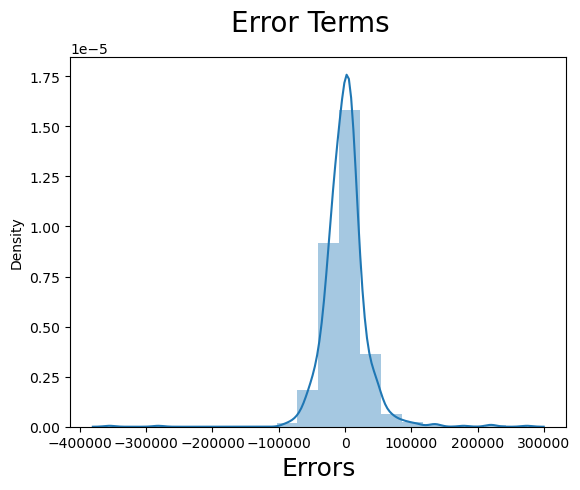

In [171]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_cnst), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

### Evaluate R2 of Train model

In [172]:
#evalate model
r2 = r2_score(y_true = y_train,y_pred = y_train_cnst)
round(r2,2)

0.82

In [173]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_train - y_train_cnst))
print(rss)
mse = mean_squared_error(y_train, y_train_cnst)
print(mse)
rmse = mse**0.5
print(rmse)

1164125317381.4236
1140181505.760454
33766.57379362694


In [174]:
# Residual analysis
y_res = (y_train - y_train_cnst)
#y_res

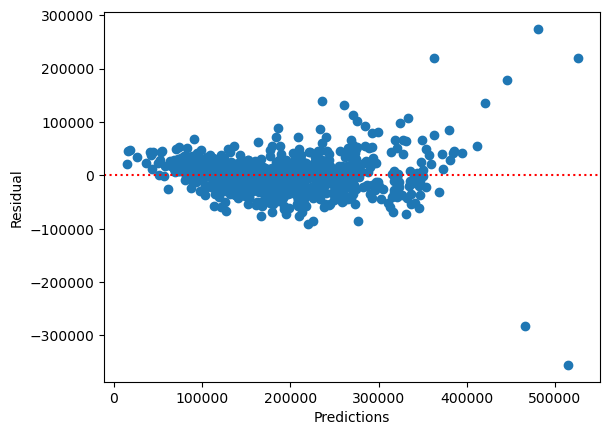

In [175]:
# data['res'] = y_res
plt.scatter( y_train_cnst , y_res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions")
plt.ylabel("Residual")
plt.show()

### Prediction and Evalution on Test Data

In [176]:
#scale Test set
df_test[num_vars] = scaler.transform(df_test[num_vars])
df_test.head()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
1436,-0.433386,-0.144614,-1.496155,0.384025,-0.679020,-0.558025,-0.699764,-0.533302,-0.653302,0.665348,0.361022,-0.293313,-0.703973,-0.431488,-1.181447,-0.765928,-0.789230,-0.124502,-1.230557,-0.837450,-0.247791,-1.028080,-0.753316,0.175669,-0.234155,-0.776063,-0.937484,-0.927153,-0.985354,0.232304,0.306009,0.264038,-0.744598,-0.710899,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.469175,120500,-0.016404,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
57,0.880036,0.112107,0.648310,-0.532073,0.923321,-0.558025,1.051361,0.577925,-0.653302,-1.226909,-0.964030,-0.293313,0.660517,-0.440205,0.871757,-0.775986,1.186484,-0.124502,0.379709,-0.837450,-0.247791,0.784821,1.244440,0.175669,-0.234155,0.741868,0.308833,-0.927153,-0.985354,0.298247,0.306009,0.438477,-0.744598,0.347093,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,0.622834,196500,-1.137362,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0
780,-0.297515,-0.253806,0.648310,-0.532073,0.534875,-0.355087,-0.699764,0.577925,-0.653302,-1.226909,-0.964030,-0.293313,1.501060,0.381373,-0.154845,0.212191,-0.789230,-0.124502,-0.498789,-0.837450,-0.247791,0.784821,-0.753316,0.175669,-0.234155,-0.776063,-0.314326,0.622148,0.658513,0.278464,0.306009,-0.329996,1.023633,-0.393502,-0.368121,-0.121922,-0.275126,-0.062302,-0.084263,-0.105172,176000,-0.807668,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [177]:
df_test.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,HouseAge,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.0,439.0,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.0,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000
mean,0.044381,0.008671,0.014903,-0.016637,-0.019148,-0.024379,-0.021652,0.033702,-0.110963,-0.074960,-0.032377,-0.068902,0.025916,-0.033111,-0.019212,-0.05004

In [178]:
#create y_test and X_test
y_test = df_test.pop('SalePrice')
X_test = df_test

In [179]:
#trained model columns
X_train_new.columns

Index(['OverallQual', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotShape_IR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng'], dtype='object')

In [180]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [181]:
#Running the Linear Model
test_lm = sm.OLS(y_test,X_test_new).fit()

In [182]:
#check summary()
test_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     127.3
Date:                Wed, 27 Sep 2023   Prob (F-statistic):          9.91e-164
Time:                        00:30:36   Log-Likelihood:                -5150.4
No. Observations:                 439   AIC:                         1.034e+04
Df Residuals:                     418   BIC:                         1.043e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.685e+05   4261.555     39.538      0.000     1.6e+05    1.77e+05
OverallQual            2.59e+04   2586.977     10.013      0.000    2.08e+04     3.1e+04
BsmtUnfSF            -1.113e+04   1760.239     -6.324      0.000   -1.46e+04   -7671.604
TotalBsmtSF           1.617e+04   2399.799      6.736      0.000    1.14e+04    2.09e+04
LowQualFinSF           630.4754   1525.538      0.413      0.680   -2368.207    3629.158
GrLivArea             2.564e+04   2304.040     11.130      0.000    2.11e+04    3.02e+04
GarageCars            1.156e+04   2083.603      5.546      0.000    7460.135    1.57e+04
MSSubClass_120       -2.252e+04   7372.592     -3.055      0.002    -3.7e+04   -8030.367
MSSubClass_160       -3.081e+04   8355.655     -3.687      0.000   -4.72e+04   -1.44e+04
MSZoning_RL           8740.4144   4495.069      1.944      0.053     -95.342    1.76e+04
LotShape_IR3           1.17e+04   3.12e+04      0.375      0.708   -4.97e+04     7.3e+04
Neighborhood_ClearCr  1.048e+04   1.14e+04      0.922      0.357   -1.19e+04    3.28e+04
Neighborhood_Crawfor  1.935e+04   7555.921      2.561      0.011    4500.239    3.42e+04
Neighborhood_NoRidge  2.842e+04   1.38e+04      2.065      0.040    1369.004    5.55e+04
Neighborhood_NridgHt  7.596e+04   8430.141      9.011      0.000    5.94e+04    9.25e+04
Neighborhood_Somerst  2.071e+04   7421.975      2.790      0.006    6117.222    3.53e+04
Neighborhood_StoneBr  8.424e+04      1e+04      8.407      0.000    6.45e+04    1.04e+05
Neighborhood_Veenker   2.23e-11    8.9e-12      2.505      0.013     4.8e-12    3.98e-11
Exterior1st_CemntBd   2.103e+04   7129.968      2.949      0.003    7013.106     3.5e+04
Exterior1st_ImStucc   1.199e-11   4.18e-12      2.869      0.004    3.78e-12    2.02e-11
Exterior2nd_ImStucc   3.553e+04   2.32e+04      1.533      0.126      -1e+04    8.11e+04
Exterior2nd_Stucco   -2879.1778    1.3e+04     -0.222      0.824   -2.83e+04    2.26e+04
Exterior2nd_Wd Shng   1.699e+04   1.28e+04      1.323      0.186   -8247.085    4.22e+04
==============================================================================
Omnibus:                       88.900   Durbin-Watson:                   1.831
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              673.768
Skew:                           0.624   Prob(JB):                    4.93e-147
Kurtosis:                       8.939   Cond. No.                     1.32e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.45e-34. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [183]:
# Making predictions
y_pred = lm.predict(X_test_new)

### calculate r2 score of Test model

In [184]:
#evalate model
r2 = r2_score(y_true = y_test,y_pred = y_pred)
round(r2,2)

0.83

In [185]:
#Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
rss = np.sum(np.square(y_test - y_pred))
print(rss)
mse = mean_squared_error(y_test, y_pred)
print(mse)
rmse = mse**0.5
print(rmse)

492700357714.79114
1122324277.2546494
33501.10859739793


In [186]:
#drop the const
X_test_new = X_test_new.drop(['const'], axis=1)

In [175]:
#check final VIf of 9 columns
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,TotalBsmtSF,3.90
3,1stFlrSF,3.71
0,OverallQual,2.36
4,2ndFlrSF,1.64
12,Neighborhood_NridgHt,1.31
1,BsmtUnfSF,1.30
7,MSSubClass_120,1.30
8,MSSubClass_160,1.28
13,Neighborhood_Somerst,1.26
11,Neighborhood_NoRidge,1.23


Text(0, 0.5, 'y_pred')

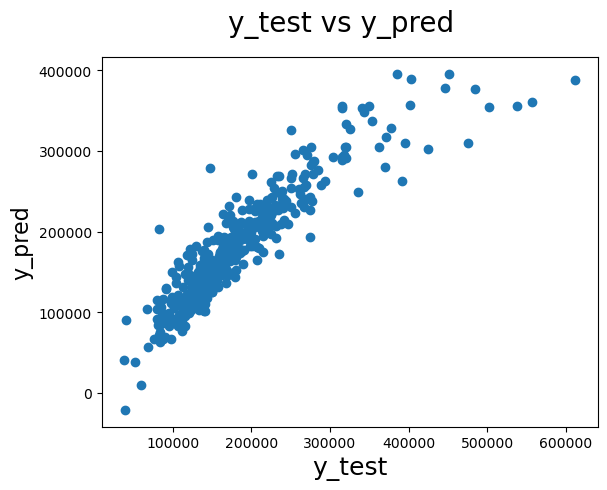

In [187]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [188]:
X_train_new.columns

Index(['OverallQual', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotShape_IR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng'], dtype='object')

In [190]:
#final dataframe 
final_df = house_data[['OverallQual', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotShape_IR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng']]
final_df.head()

,OverallQual,BsmtUnfSF,TotalBsmtSF,LowQualFinSF,GrLivArea,GarageCars,MSSubClass_120,MSSubClass_160,MSZoning_RL,LotShape_IR3,Neighborhood_ClearCr,Neighborhood_Crawfor,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Veenker,Exterior1st_CemntBd,Exterior1st_ImStucc,Exterior2nd_ImStucc,Exterior2nd_Stucco,Exterior2nd_Wd Shng
0,7,150,856,0,1710,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,6,284,1262,0,1262,2,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,7,434,920,0,1786,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,7,540,756,0,1717,3,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1
4,8,490,1145,0,2198,3,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0


### Final evalution
In the final evaluation, we have selected 21 variables for our model, which include 'OverallQual', 'BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GrLivArea', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotShape_IR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng'. The model has a Variance Inflation Factor (VIF) less than 5 and a p-value less than 0.07.

The R-squared score for the train dataset is 0.82, and for the test dataset, it is 0.83.

In [191]:
y_pred_train = lm.predict(X_train_lm)
# y_pred_test = test_lm.predict(X_test_new)
y_pred_test = y_pred

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.8175882963220226
0.8256375502673778
1164125317381.4236
492700357714.79114
1140181505.760454
1122324277.2546494


### Ridge Regression

In [192]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [193]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 10.0}


In [194]:
#Fitting Ridge model for alpha = 20 and printing coefficients which have been penalised
alpha = 10
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)
print(ridge.coef_)

[ 30230.90287266  -7662.44679404  13553.98008581  -2473.96852087
  22263.03311717  11351.81739381  -8941.26070112 -23065.70746493
  12431.4149823  -13507.53048174  16343.34293474  18441.94831373
  41035.84995578  40247.32212107  24489.68187858  13875.39422487
  16207.39941395   9003.49932686  -4934.09265965   8213.00976864
 -22298.36925953 -12043.74525633]


In [195]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.8113634537613774
0.8194600866277203
1203851369358.6206
510156172023.98846
1179090469.4991386
1162086952.2186525


## Lasso

In [196]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [197]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 100}


In [198]:
#Fitting Ridge model for alpha = 100 and printing coefficients which have been penalised

alpha =100

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=100)

In [199]:
lasso.coef_

array([ 29297.54019473,  -7639.32964438,  12998.77601083,  -2427.66836632,
        21954.63906082,  10760.06172105, -10954.11846964, -28583.66504239,
        11808.05127393, -13284.86516106,  21411.61750549,  23891.25973462,
        54468.00783864,  50733.13727501,  31016.12480966,  22454.82193994,
        24845.22653861,   8332.7714808 ,     -0.        ,   4214.53834379,
       -28024.05618821, -13675.23349193])

In [200]:
# Lets calculate some metrics such as R2 score, RSS and RMSE

y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.8150928379477456
0.8216325439220409
1180050974635.8271
504017404831.43506
1155779602.973386
1148103427.8620389


In [201]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),8.175883e-01,8.113635e-01,8.150928e-01
1,R2 Score (Test),8.256376e-01,8.194601e-01,8.216325e-01
2,RSS (Train),1.164125e+12,1.203851e+12,1.180051e+12
3,RSS (Test),4.927004e+11,5.101562e+11,5.040174e+11
4,MSE (Train),3.376657e+04,3.433789e+04,3.399676e+04
5,MSE (Test),3.350111e+04,3.408940e+04,3.388367e+04


## Lets observe the changes in the coefficients after regularization

In [203]:
betas = pd.DataFrame(index=X_train_new.columns)

In [205]:
betas.rows = X_train_new.columns

In [206]:
betas['Linear'] = lm.params
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

In [207]:
pd.set_option('display.max_rows', None)
betas.head(68)

,Linear,Ridge,Lasso
OverallQual,28777.785040,30230.902873,29297.540195
BsmtUnfSF,-7746.050594,-7662.446794,-7639.329644
TotalBsmtSF,12807.645522,13553.980086,12998.776011
LowQualFinSF,-2502.502933,-2473.968521,-2427.668366
GrLivArea,21536.842263,22263.033117,21954.639061
GarageCars,10701.737326,11351.817394,10760.061721
MSSubClass_120,-16065.329262,-8941.260701,-10954.118470
MSSubClass_160,-33446.940111,-23065.707465,-28583.665042
MSZoning_RL,11395.115711,12431.414982,11808.051274
LotShape_IR3,-22369.390336,-13507.530482,-13284.865161


### Q1: Double the values of Alpha for lasso & Ridge

In [213]:
#earlier for Ridge alpha = 10 now take 20
alpha = 20
ridge = Ridge(alpha=alpha)

ridge.fit(X_train_new, y_train)

column_names = X_train_new.columns

# Print the coefficients with their corresponding column names
for coef, col in zip(ridge.coef_, column_names):
    print(f"{col}: {coef}")
#print(ridge.coef_)
y_pred_train = ridge.predict(X_train_new)
y_pred_test = ridge.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

OverallQual: 30741.971117024583
BsmtUnfSF: -7490.924380102218
TotalBsmtSF: 13965.432973096254
LowQualFinSF: -2448.903054486595
GrLivArea: 22447.52004983803
GarageCars: 11820.017661752589
MSSubClass_120: -6338.358902964708
MSSubClass_160: -17925.36877328914
MSZoning_RL: 12332.861960431497
LotShape_IR3: -9709.292213519831
Neighborhood_ClearCr: 11692.30885591457
Neighborhood_Crawfor: 13572.678657863462
Neighborhood_NoRidge: 31746.40560576966
Neighborhood_NridgHt: 32098.412028057788
Neighborhood_Somerst: 18865.146668802474
Neighborhood_StoneBr: 8025.449801926344
Neighborhood_Veenker: 10108.560757022271
Exterior1st_CemntBd: 7480.742770016002
Exterior1st_ImStucc: -2138.1240211248623
Exterior2nd_ImStucc: 5343.532401273894
Exterior2nd_Stucco: -16887.92142197009
Exterior2nd_Wd Shng: -9245.66747956458
0.8052828711980426
0.8151461318999922


___Coeff values are increasing as alpha will increase.r2_score of train data is also drop from .807 to 0.45___

In [211]:
#earlier for Lasso alpha = 100 now take 200
alpha =200

lasso = Lasso(alpha=alpha)

lasso.fit(X_train_new, y_train) 

column_names = X_train_new.columns

# Print the coefficients with their corresponding column names
for coef, col in zip(lasso.coef_, column_names):
    print(f"{col}: {coef}")

#print(lasso.coef_)
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

OverallQual: 29894.344500833926
BsmtUnfSF: -7562.2583863441
TotalBsmtSF: 13185.796587811024
LowQualFinSF: -2281.583379037085
GrLivArea: 22080.703676266996
GarageCars: 10963.65600687259
MSSubClass_120: -6349.7094173275345
MSSubClass_160: -24279.173323050538
MSZoning_RL: 12120.417304046738
LotShape_IR3: -3888.177133693293
Neighborhood_ClearCr: 15339.75268692362
Neighborhood_Crawfor: 18617.363974291227
Neighborhood_NoRidge: 49627.90810725961
Neighborhood_NridgHt: 45134.97279391407
Neighborhood_Somerst: 26867.310498365998
Neighborhood_StoneBr: 9982.256917364646
Neighborhood_Veenker: 12862.702039070911
Exterior1st_CemntBd: 6088.8306220414515
Exterior1st_ImStucc: -0.0
Exterior2nd_ImStucc: 0.0
Exterior2nd_Stucco: -22986.288576794224
Exterior2nd_Wd Shng: -9805.451712579514
0.8111613088128129
0.8150893450102871


___As alpha value increased more feautrues removed from model. But r2score is also dropped by 1% in both test and train data___

### Que3: Drop the Top 5 features and rebuild lasso
___Top 5 features are Neighborhood_NridgHt,
Neighborhood_NoRidge,
OverallQual,
GrLivArea,
Neighborhood_Somerst
___

In [217]:
#Drop 5 features
X_train_new = X_train_new.drop(['Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'GrLivArea', 'OverallQual'
                               , 'Neighborhood_Somerst'], axis=1)


In [218]:
X_test_new = X_test_new.drop(['Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'GrLivArea', 'OverallQual'
                               , 'Neighborhood_Somerst'], axis=1)

In [219]:
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train_new, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [220]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 500}


In [221]:
#Fitting Ridge model for alpha = 500 and printing coefficients which have been penalised

alpha =500

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train_new, y_train) 

Lasso(alpha=500)

In [222]:
lasso.coef_

array([-3388.90163971, 33906.44768992,   382.12683471, 35146.689695  ,
          -0.        ,    -0.        ,  8712.31198988,    -0.        ,
           0.        , 25520.15576964,     0.        ,     0.        ,
        3886.72453476,    -0.        ,     0.        , -5386.36474939,
           0.        ])

In [223]:
y_pred_train = lasso.predict(X_train_new)
y_pred_test = lasso.predict(X_test_new)

r2_train_lr = r2_score(y_train, y_pred_train)
print(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)

0.5560375658512269
0.5809106970406641


___After dropping the top 5 features model r2 score is very low i.e. 56% for Train and 58% for Test.___

In [224]:
X_train_new.columns

Index(['BsmtUnfSF', 'TotalBsmtSF', 'LowQualFinSF', 'GarageCars', 'MSSubClass_120', 'MSSubClass_160', 'MSZoning_RL', 'LotShape_IR3', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_StoneBr', 'Neighborhood_Veenker', 'Exterior1st_CemntBd', 'Exterior1st_ImStucc', 'Exterior2nd_ImStucc', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng'], dtype='object')

___Next top 5 features after drooping 5 main predictors `GarageCars` ,`Neighborhood_Crawfor`, `MSZoning_RL`, `TotalBsmtSF`, `Exterior1st_CemntBd`___ 